# Xarray Lecture Notes 
## Gridded Data Analysis in Python Using the Xarray Library


### by: Henric R. Jandoc


### references:
### https://www.youtube.com/watch?v=Ss4ryKukhi4&list=PLn4SkZRHyJ8m5_ZEL3k9TWdD0pmUucQYi&index=4&t=2120s
### https://www.youtube.com/watch?v=2H_4drBwORY&list=PLn4SkZRHyJ8m5_ZEL3k9TWdD0pmUucQYi&index=5
### API reference: https://docs.xarray.dev/en/stable/api.html
### extra: https://nbviewer.ipython.org/github/nicolasfauchereau/metocean/blob/master/notebooks/xray.ipynb

## Downloading Data

In [1]:
import gzip
import pathlib
import shutil

import requests


def download_data(url, data_dir="data", unarchive=False, clobber=False):
    data_dir = pathlib.Path(data_dir)
    data_dir.mkdir(parents=True, exist_ok=True)
    local_filename = data_dir / url.split('/')[-1]
    if (local_filename.exists() and clobber) or not local_filename.exists():
        with requests.get(url, stream=True) as rstream:
            with local_filename.open("wb") as f:
                shutil.copyfileobj(rstream.raw, f)

    if unarchive:
        local_filename_unarchived = data_dir / local_filename.stem
        if (
            local_filename_unarchived.exists() and clobber
        ) and not local_filename_unarchived.exists():
            with gzip.open(local_filename, "rb") as fin:
                with local_filename_unarchived.open("wb") as fout:
                    shutil.copyfileobj(fin, fout)
        return str(local_filename_unarchived)
    return local_filename

In [2]:
%%time

urls = [
    ("http://download.ecmwf.int/test-data/cfgrib/era5-levels-members.grib", False),
    ("https://psl.noaa.gov/thredds/fileServer/Datasets/noaa.oisst.v2/sst.mnmean.nc", False),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r11i1p1f1/Amon/tas/gn/v20190514/tas_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r11i1p1f1/Amon/ta/gn/v20190514/ta_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r11i1p1f1/Ofx/areacello/gr/v20190514/areacello_Ofx_CESM2_historical_r11i1p1f1_gr.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r11i1p1f1/Omon/tos/gr/v20190514/tos_Omon_CESM2_historical_r11i1p1f1_gr_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r9i1p1f1/Omon/tos/gr/v20190311/tos_Omon_CESM2_historical_r9i1p1f1_gr_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r7i1p1f1/Omon/tos/gr/v20190311/tos_Omon_CESM2_historical_r7i1p1f1_gr_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r8i1p1f1/Omon/tos/gr/v20190311/tos_Omon_CESM2_historical_r8i1p1f1_gr_200001-201412.nc",
        False,
    ),
]
for url, unarchive in urls:
    download_data(url, unarchive=unarchive)

Wall time: 2.98 ms


### Xarray Fundamentals

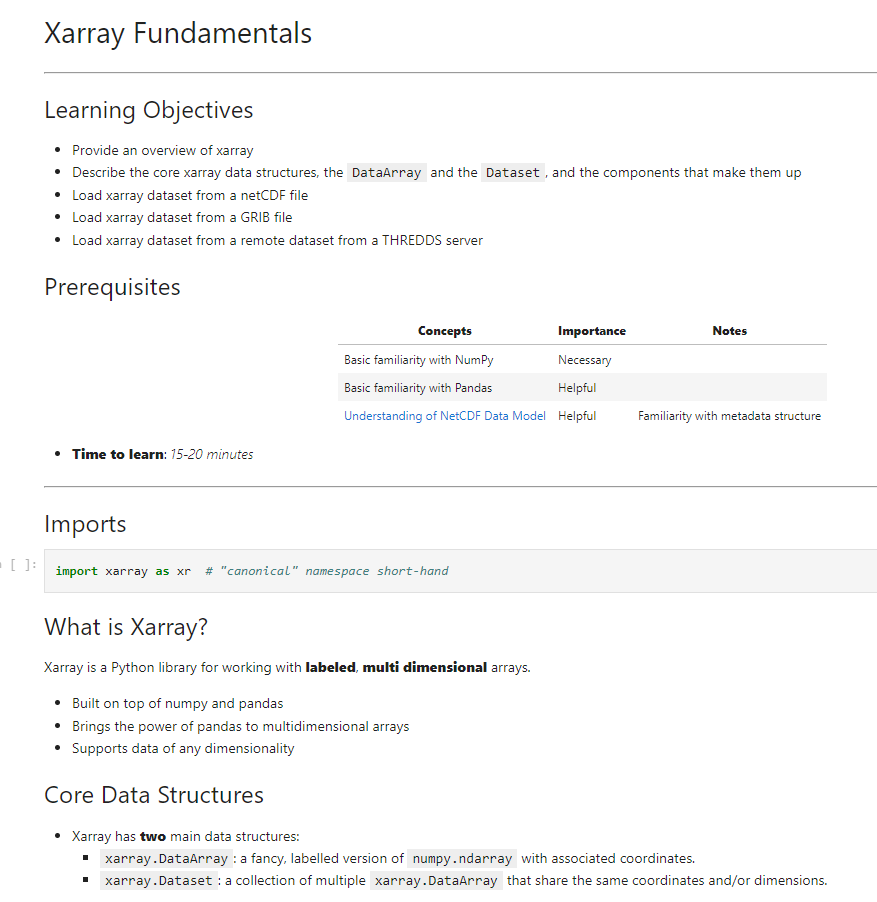

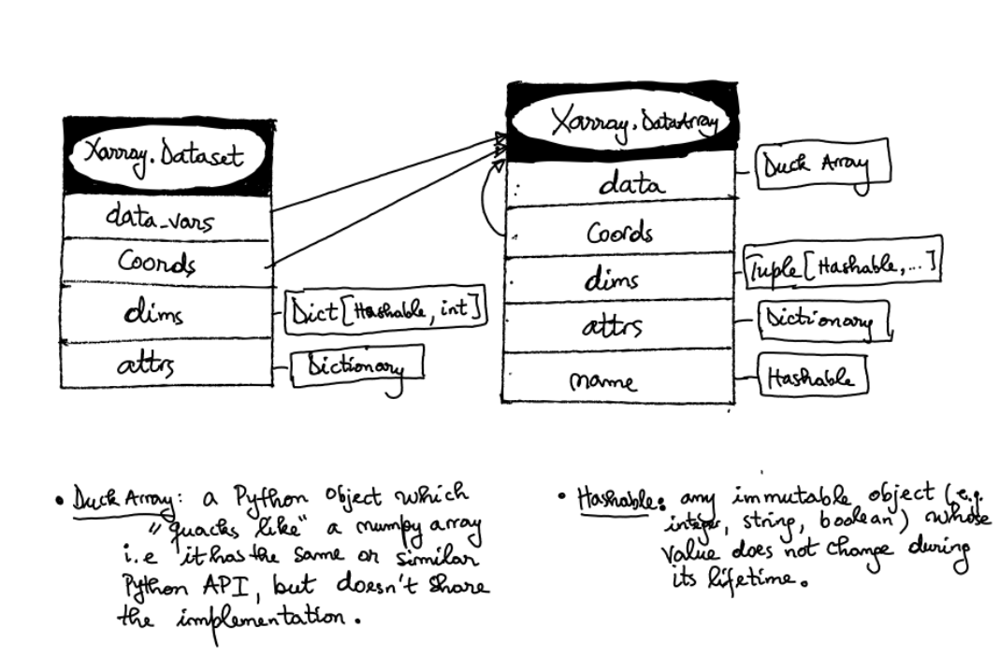

In [3]:
import xarray as xr

C:\Users\henri\anaconda3\lib\site-packages\xarray\backends\cfgrib_.py:27: UserWarning: Failed to load cfgrib - most likely there is a problem accessing the ecCodes library. Try `import cfgrib` to get the full error message
  warnings.warn(


In [4]:
ds = xr.open_dataset(
    "./data/tas_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc", engine="netcdf4"
)

C:\Users\henri\anaconda3\lib\site-packages\xarray\backends\plugins.py:61: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
C:\Users\henri\anaconda3\lib\site-packages\xarray\conventions.py:516: SerializationWarning: variable 'tas' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


By default, xarray.open_dataset() function uses lazy loading i.e. it just loads in the coordinate and attribute metadata and not the data that correspond to data variables themselves. The data variables are loaded only on actual values access (e.g. when performing some calculation, slicing, ...) or with .load() method.

In [5]:
ds.info()

xarray.Dataset {
dimensions:
	time = 180 ;
	lat = 192 ;
	lon = 288 ;
	nbnd = 2 ;

variables:
	float32 tas(time, lat, lon) ;
		tas:cell_measures = area: areacella ;
		tas:cell_methods = area: time: mean ;
		tas:comment = TREFHT ;
		tas:description = near-surface (usually, 2 meter) air temperature ;
		tas:frequency = mon ;
		tas:id = tas ;
		tas:long_name = Near-Surface Air Temperature ;
		tas:mipTable = Amon ;
		tas:out_name = tas ;
		tas:prov = Amon ((isd.003)) ;
		tas:realm = atmos ;
		tas:standard_name = air_temperature ;
		tas:time = time ;
		tas:time_label = time-mean ;
		tas:time_title = Temporal mean ;
		tas:title = Near-Surface Air Temperature ;
		tas:type = real ;
		tas:units = K ;
		tas:variable_id = tas ;
	float64 lat(lat) ;
		lat:axis = Y ;
		lat:bounds = lat_bnds ;
		lat:standard_name = latitude ;
		lat:title = Latitude ;
		lat:type = double ;
		lat:units = degrees_north ;
		lat:valid_max = 90.0 ;
		lat:valid_min = -90.0 ;
	float64 lon(lon) ;
		lon:axis = X ;
		lon:bounds =

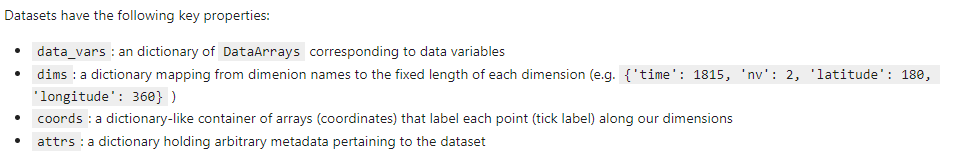

In [6]:
# variables that are in our dataset
ds.data_vars

Data variables:
    tas        (time, lat, lon) float32 ...
    time_bnds  (time, nbnd) object ...
    lat_bnds   (lat, nbnd) float64 ...
    lon_bnds   (lon, nbnd) float64 ...

In [7]:
# dataset dimensions
ds.dims

Frozen({'time': 180, 'lat': 192, 'lon': 288, 'nbnd': 2})

In [8]:
# dataset coordinates
ds.coords

Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [9]:
#dataset global attributes
ds.attrs

{'Conventions': 'CF-1.7 CMIP-6.2',
 'activity_id': 'CMIP',
 'branch_method': 'standard',
 'branch_time_in_child': 674885.0,
 'branch_time_in_parent': 219000.0,
 'case_id': '972',
 'cesm_casename': 'b.e21.BHIST.f09_g17.CMIP6-historical.011',
 'contact': 'cesm_cmip6@ucar.edu',
 'creation_date': '2019-04-02T05:28:31Z',
 'data_specs_version': '01.00.29',
 'experiment': 'Simulation of recent past (1850 to 2014). Impose changing conditions (consistent with observations). Should be initialised from a point early enough in the pre-industrial control run to ensure that the end of all the perturbed runs branching from the end of this historical run end before the end of the control. Only one ensemble member is requested but modelling groups are strongly encouraged to submit at least three ensemble members of their CMIP historical simulation. ',
 'experiment_id': 'historical',
 'external_variables': 'areacella',
 'forcing_index': 1,
 'frequency': 'mon',
 'further_info_url': 'https://furtherinfo.e

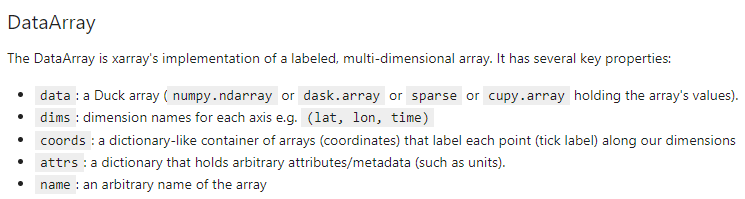

In [10]:
# extracting the tas variable (dataarray)
ds['tas']

<xarray.DataArray 'tas' (time: 180, lat: 192, lon: 288)>
[9953280 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [11]:
# can also use the dot notation but some unexpected behavior may occur, not recommended

In [12]:
# the actual array data
ds['tas'].data

array([[[247.15303, 247.15302, 247.15302, ..., 247.153  , 247.15302,
         247.15302],
        [247.80325, 247.74376, 247.56442, ..., 247.91016, 247.88065,
         247.84268],
        [248.37344, 248.29222, 248.23836, ..., 248.71902, 248.63567,
         248.52878],
        ...,
        [240.68915, 240.70212, 240.7148 , ..., 240.6477 , 240.66093,
         240.6746 ],
        [240.98354, 240.9889 , 240.99457, ..., 240.96875, 240.97357,
         240.97845],
        [241.1705 , 241.17052, 241.17053, ..., 241.17044, 241.17046,
         241.17047]],

       [[236.51689, 236.51689, 236.51689, ..., 236.51689, 236.51689,
         236.51689],
        [236.9432 , 236.89592, 236.73224, ..., 236.99376, 236.97823,
         236.96432],
        [237.28722, 237.2335 , 237.1985 , ..., 237.55449, 237.49416,
         237.40793],
        ...,
        [241.329  , 241.3181 , 241.30516, ..., 241.35661, 241.34663,
         241.33691],
        [241.3106 , 241.30481, 241.29861, ..., 241.32701, 241.32219,
   

In [13]:
# dataarray coordinates
ds['tas'].coords

Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [14]:
# dataarray attributes
ds['tas'].attrs

{'cell_measures': 'area: areacella',
 'cell_methods': 'area: time: mean',
 'comment': 'TREFHT',
 'description': 'near-surface (usually, 2 meter) air temperature',
 'frequency': 'mon',
 'id': 'tas',
 'long_name': 'Near-Surface Air Temperature',
 'mipTable': 'Amon',
 'out_name': 'tas',
 'prov': 'Amon ((isd.003))',
 'realm': 'atmos',
 'standard_name': 'air_temperature',
 'time': 'time',
 'time_label': 'time-mean',
 'time_title': 'Temporal mean',
 'title': 'Near-Surface Air Temperature',
 'type': 'real',
 'units': 'K',
 'variable_id': 'tas'}

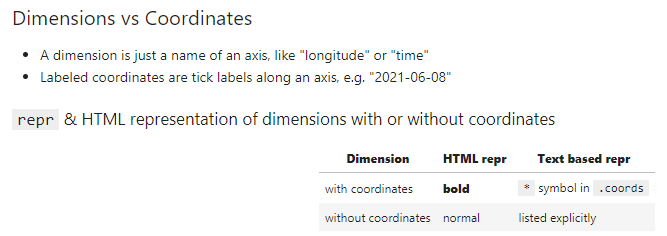

In [145]:
# loading data in other file formats

ds = xr.open_dataset("./data/era5-levels-members.grib", engine="cfgrib")
ds

ValueError: unrecognized engine cfgrib must be one of: ['netcdf4', 'scipy', 'store', 'zarr']

In [19]:
# loading data from a remote OPENDAP server

# url = 'http://esgf-data.ucar.edu/thredds/dodsC/esg_dataroot/CMIP6/CMIP/NCAR/CESM2/historical/r11i1p1f1/Amon/tas/gn/v20190514/tas_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc'

In [20]:
# xr.open_dataset(url, engine = 'netcdf4')

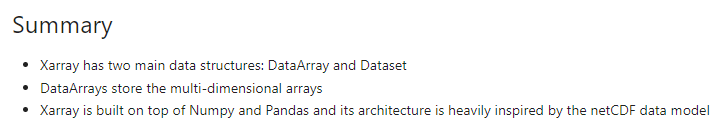

# Indexing and Slicing

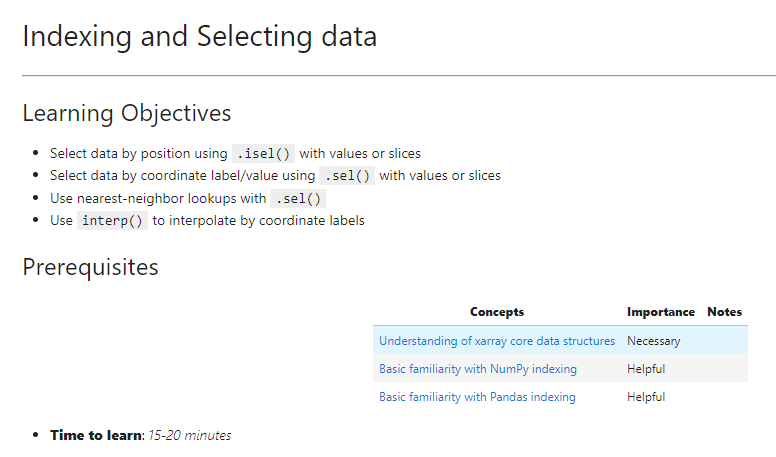

In [21]:
ds = xr.open_dataset(
    "./data/tas_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc", engine="netcdf4"
)
ds

C:\Users\henri\anaconda3\lib\site-packages\xarray\conventions.py:516: SerializationWarning: variable 'tas' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


<xarray.Dataset>
Dimensions:    (time: 180, lat: 192, lon: 288, nbnd: 2)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Dimensions without coordinates: nbnd
Data variables:
    tas        (time, lat, lon) float32 ...
    time_bnds  (time, nbnd) object ...
    lat_bnds   (lat, nbnd) float64 ...
    lon_bnds   (lon, nbnd) float64 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Amon
    tracking_id:            hdl:21.14100/a7278f6d-6a1b-4050-8f06-a8033604736a
    variable_id:            tas
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

## Numpy Positional Indexing

In [22]:
temp = ds['tas'].data # retrieve numpy array

In [23]:
temp

array([[[247.15303, 247.15302, 247.15302, ..., 247.153  , 247.15302,
         247.15302],
        [247.80325, 247.74376, 247.56442, ..., 247.91016, 247.88065,
         247.84268],
        [248.37344, 248.29222, 248.23836, ..., 248.71902, 248.63567,
         248.52878],
        ...,
        [240.68915, 240.70212, 240.7148 , ..., 240.6477 , 240.66093,
         240.6746 ],
        [240.98354, 240.9889 , 240.99457, ..., 240.96875, 240.97357,
         240.97845],
        [241.1705 , 241.17052, 241.17053, ..., 241.17044, 241.17046,
         241.17047]],

       [[236.51689, 236.51689, 236.51689, ..., 236.51689, 236.51689,
         236.51689],
        [236.9432 , 236.89592, 236.73224, ..., 236.99376, 236.97823,
         236.96432],
        [237.28722, 237.2335 , 237.1985 , ..., 237.55449, 237.49416,
         237.40793],
        ...,
        [241.329  , 241.3181 , 241.30516, ..., 241.35661, 241.34663,
         241.33691],
        [241.3106 , 241.30481, 241.29861, ..., 241.32701, 241.32219,
   

In [24]:
temp.shape, temp.ndim

((180, 192, 288), 3)

In [25]:
# extract a timeseries for a single spatial location

temp[:, 20, 40].shape

(180,)

## Different choices for indexing

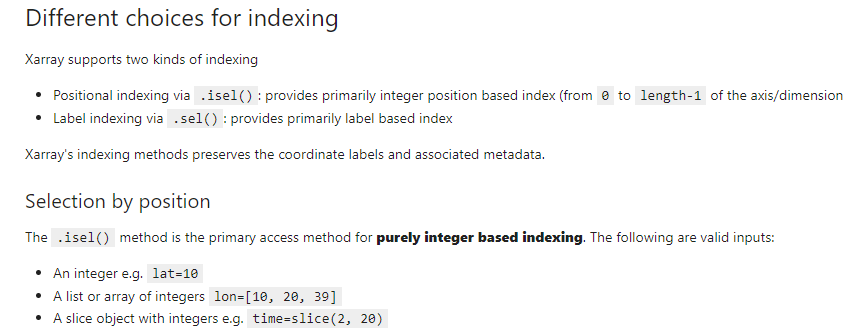

In [26]:
ds['tas'].isel() # the original object, no selection

<xarray.DataArray 'tas' (time: 180, lat: 192, lon: 288)>
array([[[247.15303, 247.15302, ..., 247.15302, 247.15302],
        [247.80325, 247.74376, ..., 247.88065, 247.84268],
        ...,
        [240.98354, 240.9889 , ..., 240.97357, 240.97845],
        [241.1705 , 241.17052, ..., 241.17046, 241.17047]],

       [[236.51689, 236.51689, ..., 236.51689, 236.51689],
        [236.9432 , 236.89592, ..., 236.97823, 236.96432],
        ...,
        [241.3106 , 241.30481, ..., 241.32219, 241.31647],
        [241.32259, 241.32254, ..., 241.32271, 241.32265]],

       ...,

       [[235.53151, 235.53151, ..., 235.53151, 235.53151],
        [236.374  , 236.32649, ..., 236.41884, 236.39745],
        ...,
        [259.4753 , 259.47998, ..., 259.46725, 259.47116],
        [259.7919 , 259.79153, ..., 259.79282, 259.79233]],

       [[250.03975, 250.03975, ..., 250.03976, 250.03975],
        [250.7029 , 250.66605, ..., 250.72278, 250.71268],
        ...,
        [253.26057, 253.28796, ..., 253.20187, 253.23189],
        [252.8665 , 252.86855, ..., 252.86179, 252.86426]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [27]:
ds['tas'].isel(lat = 100)

<xarray.DataArray 'tas' (time: 180, lon: 288)>
array([[301.03406, 301.086  , 301.10083, ..., 300.90924, 301.00153, 301.02826],
       [300.8836 , 300.8504 , 300.92484, ..., 301.13306, 301.07187, 300.9965 ],
       [301.37515, 301.41602, 301.3797 , ..., 301.3015 , 301.2557 , 301.29398],
       ...,
       [300.44745, 300.53033, 300.60065, ..., 300.5099 , 300.44482, 300.42026],
       [300.98123, 301.08792, 301.12793, ..., 300.82452, 300.79416, 300.8434 ],
       [301.2596 , 301.38248, 301.45828, ..., 301.04367, 301.0475 , 301.14404]],
      dtype=float32)
Coordinates:
    lat      float64 4.241
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [28]:
ds['tas'].isel(lat = 100, time = [-2, -1])

<xarray.DataArray 'tas' (time: 2, lon: 288)>
array([[300.98123, 301.08792, 301.12793, ..., 300.82452, 300.79416, 300.8434 ],
       [301.2596 , 301.38248, 301.45828, ..., 301.04367, 301.0475 , 301.14404]],
      dtype=float32)
Coordinates:
    lat      float64 4.241
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2014-11-15 00:00:00 2014-12-15 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [29]:
ds.tas.isel(lat = 100, lon = 100, time = slice(10, 20))

<xarray.DataArray 'tas' (time: 10)>
array([301.72015, 301.51614, 301.89267, 300.73877, 300.89877, 301.16006,
       301.5239 , 301.39157, 301.86575, 302.2434 ], dtype=float32)
Coordinates:
    lat      float64 4.241
    lon      float64 125.0
  * time     (time) object 2000-11-15 00:00:00 ... 2001-08-15 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

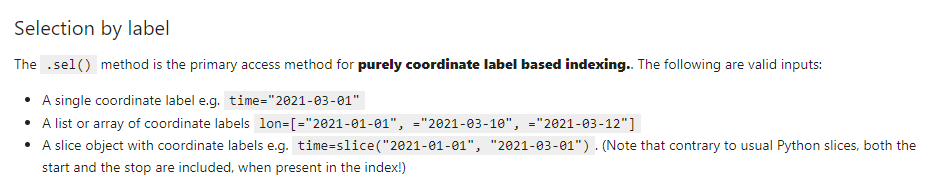

In [30]:
ds.tas.sel(time = '2013')

<xarray.DataArray 'tas' (time: 12, lat: 192, lon: 288)>
array([[[251.0122 , 251.01219, ..., 251.01219, 251.01219],
        [251.75168, 251.70715, ..., 251.77245, 251.76056],
        ...,
        [246.26265, 246.28883, ..., 246.20654, 246.23535],
        [246.07198, 246.07327, ..., 246.06903, 246.07057]],

       [[237.78917, 237.78917, ..., 237.78917, 237.78917],
        [238.95834, 238.91258, ..., 238.98819, 238.97308],
        ...,
        [240.98769, 240.98885, ..., 240.98486, 240.98642],
        [240.97531, 240.97554, ..., 240.97476, 240.97505]],

       ...,

       [[239.45691, 239.45691, ..., 239.45691, 239.45691],
        [240.32988, 240.30064, ..., 240.33969, 240.33632],
        ...,
        [259.88977, 259.91068, ..., 259.848  , 259.86908],
        [260.16348, 260.1648 , ..., 260.16043, 260.16202]],

       [[248.43866, 248.43864, ..., 248.43866, 248.43858],
        [249.02176, 248.98167, ..., 249.04703, 249.03409],
        ...,
        [253.37564, 253.40202, ..., 253.31888, 253.34825],
        [253.26901, 253.27061, ..., 253.26532, 253.26726]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2013-01-15 12:00:00 ... 2013-12-15 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [31]:
ds.tas.sel(time = slice('2013-01-01', '2014-12-31'))

<xarray.DataArray 'tas' (time: 24, lat: 192, lon: 288)>
array([[[251.0122 , 251.01219, ..., 251.01219, 251.01219],
        [251.75168, 251.70715, ..., 251.77245, 251.76056],
        ...,
        [246.26265, 246.28883, ..., 246.20654, 246.23535],
        [246.07198, 246.07327, ..., 246.06903, 246.07057]],

       [[237.78917, 237.78917, ..., 237.78917, 237.78917],
        [238.95834, 238.91258, ..., 238.98819, 238.97308],
        ...,
        [240.98769, 240.98885, ..., 240.98486, 240.98642],
        [240.97531, 240.97554, ..., 240.97476, 240.97505]],

       ...,

       [[235.53151, 235.53151, ..., 235.53151, 235.53151],
        [236.374  , 236.32649, ..., 236.41884, 236.39745],
        ...,
        [259.4753 , 259.47998, ..., 259.46725, 259.47116],
        [259.7919 , 259.79153, ..., 259.79282, 259.79233]],

       [[250.03975, 250.03975, ..., 250.03976, 250.03975],
        [250.7029 , 250.66605, ..., 250.72278, 250.71268],
        ...,
        [253.26057, 253.28796, ..., 253.20187, 253.23189],
        [252.8665 , 252.86855, ..., 252.86179, 252.86426]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2013-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [32]:
# ds.tas.sel(lat = 39.5, lon = 105.7)

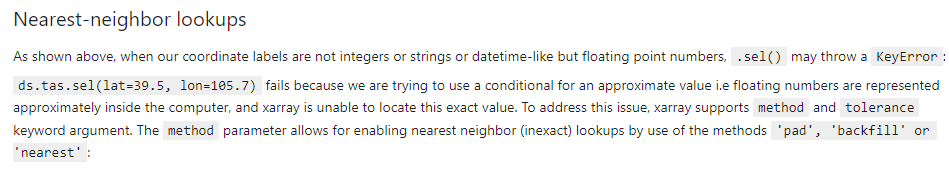

In [33]:
ds.tas.sel(lat = 39.5, lon = 105.7, method = 'nearest')

<xarray.DataArray 'tas' (time: 180)>
array([262.42212, 270.32382, 278.02744, 284.3488 , 293.25583, 298.99918,
       300.52612, 297.69995, 290.17285, 283.19998, 276.20874, 267.84622,
       265.3969 , 271.87668, 277.46265, 287.8647 , 292.2344 , 296.8831 ,
       299.92737, 298.30875, 291.7864 , 284.56534, 277.4121 , 267.9837 ,
       267.01407, 269.7421 , 278.26392, 288.1295 , 295.69   , 296.7765 ,
       297.47452, 297.34897, 290.92914, 285.12503, 275.41315, 269.52313,
       270.34836, 271.50192, 280.4425 , 287.8625 , 293.02795, 296.28156,
       299.06955, 299.05276, 291.77768, 282.4997 , 276.39285, 270.58676,
       267.21237, 270.91025, 281.11908, 287.50314, 290.77524, 296.76663,
       300.13013, 299.584  , 293.09683, 284.41708, 276.48917, 271.1439 ,
       265.34262, 270.89792, 277.89838, 286.27054, 292.301  , 297.6358 ,
       300.18066, 297.39957, 290.1503 , 283.70972, 274.46173, 270.83188,
       267.2768 , 270.8219 , 276.92633, 286.0151 , 293.00873, 296.56555,
       298.21762, 298.12408, 291.13626, 283.44547, 276.59982, 271.13477,
       267.8631 , 272.82382, 277.06924, 288.78372, 290.6359 , 294.64703,
       299.5449 , 296.856  , 292.42624, 283.48538, 277.75186, 273.07843,
       268.08612, 270.60092, 274.60318, 282.9708 , 291.96896, 295.53333,
       299.63574, 297.7455 , 290.50516, 285.60638, 275.57184, 271.9274 ,
       268.94867, 272.37598, 279.25262, 286.847  , 292.295  , 295.5027 ,
       300.4961 , 297.5326 , 291.99866, 283.08932, 276.66614, 271.30875,
       269.84644, 273.5247 , 278.82794, 288.26575, 294.60513, 297.2515 ,
       301.69882, 298.76624, 291.93823, 284.82388, 275.93225, 270.62943,
       270.41272, 271.89618, 278.734  , 286.68945, 293.7474 , 296.6049 ,
       301.17947, 300.43378, 291.8476 , 283.5131 , 276.17276, 271.65326,
       265.8642 , 268.07227, 280.3459 , 286.1488 , 293.28336, 296.44278,
       300.34897, 300.04114, 293.95288, 283.60764, 277.09372, 271.61826,
       268.769  , 271.2471 , 277.20398, 287.82834, 293.26044, 296.98453,
       301.7728 , 298.45126, 292.64316, 282.6202 , 277.466  , 271.37894,
       269.74258, 270.59058, 279.58582, 288.12704, 293.4532 , 297.16147,
       300.95575, 299.9192 , 291.52426, 283.96085, 277.2278 , 269.13263],
      dtype=float32)
Coordinates:
    lat      float64 39.11
    lon      float64 106.2
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [34]:
ds.tas.sel(lat = slice(39, 39.5), lon = slice(106.1, 106.3))

<xarray.DataArray 'tas' (time: 180, lat: 1, lon: 1)>
array([[[262.42212]],

       [[270.32382]],

       [[278.02744]],

       [[284.3488 ]],

       [[293.25583]],

       [[298.99918]],

       [[300.52612]],

       [[297.69995]],

       [[290.17285]],

       [[283.19998]],

       [[276.20874]],

       [[267.84622]],

       [[265.3969 ]],

       [[271.87668]],

       [[277.46265]],

       [[287.8647 ]],

       [[292.2344 ]],

       [[296.8831 ]],

       [[299.92737]],

       [[298.30875]],

       [[291.7864 ]],

       [[284.56534]],

       [[277.4121 ]],

       [[267.9837 ]],

       [[267.01407]],

       [[269.7421 ]],

       [[278.26392]],

       [[288.1295 ]],

       [[295.69   ]],

       [[296.7765 ]],

       [[297.47452]],

       [[297.34897]],

       [[290.92914]],

       [[285.12503]],

       [[275.41315]],

       [[269.52313]],

       [[270.34836]],

       [[271.50192]],

       [[280.4425 ]],

       [[287.8625 ]],

       [[293.02795]],

       [[296.28156]],

       [[299.06955]],

       [[299.05276]],

       [[291.77768]],

       [[282.4997 ]],

       [[276.39285]],

       [[270.58676]],

       [[267.21237]],

       [[270.91025]],

       [[281.11908]],

       [[287.50314]],

       [[290.77524]],

       [[296.76663]],

       [[300.13013]],

       [[299.584  ]],

       [[293.09683]],

       [[284.41708]],

       [[276.48917]],

       [[271.1439 ]],

       [[265.34262]],

       [[270.89792]],

       [[277.89838]],

       [[286.27054]],

       [[292.301  ]],

       [[297.6358 ]],

       [[300.18066]],

       [[297.39957]],

       [[290.1503 ]],

       [[283.70972]],

       [[274.46173]],

       [[270.83188]],

       [[267.2768 ]],

       [[270.8219 ]],

       [[276.92633]],

       [[286.0151 ]],

       [[293.00873]],

       [[296.56555]],

       [[298.21762]],

       [[298.12408]],

       [[291.13626]],

       [[283.44547]],

       [[276.59982]],

       [[271.13477]],

       [[267.8631 ]],

       [[272.82382]],

       [[277.06924]],

       [[288.78372]],

       [[290.6359 ]],

       [[294.64703]],

       [[299.5449 ]],

       [[296.856  ]],

       [[292.42624]],

       [[283.48538]],

       [[277.75186]],

       [[273.07843]],

       [[268.08612]],

       [[270.60092]],

       [[274.60318]],

       [[282.9708 ]],

       [[291.96896]],

       [[295.53333]],

       [[299.63574]],

       [[297.7455 ]],

       [[290.50516]],

       [[285.60638]],

       [[275.57184]],

       [[271.9274 ]],

       [[268.94867]],

       [[272.37598]],

       [[279.25262]],

       [[286.847  ]],

       [[292.295  ]],

       [[295.5027 ]],

       [[300.4961 ]],

       [[297.5326 ]],

       [[291.99866]],

       [[283.08932]],

       [[276.66614]],

       [[271.30875]],

       [[269.84644]],

       [[273.5247 ]],

       [[278.82794]],

       [[288.26575]],

       [[294.60513]],

       [[297.2515 ]],

       [[301.69882]],

       [[298.76624]],

       [[291.93823]],

       [[284.82388]],

       [[275.93225]],

       [[270.62943]],

       [[270.41272]],

       [[271.89618]],

       [[278.734  ]],

       [[286.68945]],

       [[293.7474 ]],

       [[296.6049 ]],

       [[301.17947]],

       [[300.43378]],

       [[291.8476 ]],

       [[283.5131 ]],

       [[276.17276]],

       [[271.65326]],

       [[265.8642 ]],

       [[268.07227]],

       [[280.3459 ]],

       [[286.1488 ]],

       [[293.28336]],

       [[296.44278]],

       [[300.34897]],

       [[300.04114]],

       [[293.95288]],

       [[283.60764]],

       [[277.09372]],

       [[271.61826]],

       [[268.769  ]],

       [[271.2471 ]],

       [[277.20398]],

       [[287.82834]],

       [[293.26044]],

       [[296.98453]],

       [[301.7728 ]],

       [[298.45126]],

       [[292.64316]],

       [[282.6202 ]],

       [[277.466  ]],

       [[271.37894]],

       [[269.74258]],

       [[270.59058]],

       [[279.58582]],

       [[288.1

In [35]:
# operators can be chained, so multiple operators can be performed sequentially

# e.g. to select an area of interest and the first time index

ds.tas.isel(time = 0).sel(lon = slice(20, 160), lat = slice(-80,25))

<xarray.DataArray 'tas' (lat: 112, lon: 113)>
array([[246.54326, 246.2186 , 245.88135, ..., 258.37595, 259.4787 , 263.91504],
       [245.82513, 245.51976, 245.14856, ..., 256.07452, 258.19894, 259.85193],
       [245.15726, 244.89433, 244.52403, ..., 251.82669, 252.89949, 255.31674],
       ...,
       [283.3249 , 282.74887, 283.82318, ..., 296.44644, 296.54843, 296.59897],
       [283.69632, 283.40567, 284.01575, ..., 295.61093, 295.73654, 295.797  ],
       [283.70435, 284.05585, 284.16684, ..., 294.80002, 294.93195, 295.01   ]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 -79.63 -78.69 -77.75 -76.81 ... 23.09 24.03 24.97
  * lon      (lon) float64 20.0 21.25 22.5 23.75 ... 156.2 157.5 158.8 160.0
    time     object 2000-01-15 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

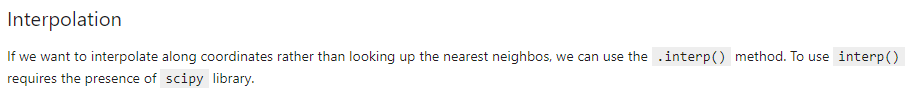

In [36]:
ds.tas.interp(lat = [10, 10.1, 10.2], method = 'nearest')

<xarray.DataArray 'tas' (time: 180, lat: 3, lon: 288)>
array([[[299.10678, 298.3701 , 297.9283 , ..., 297.73807, 298.29514,
         299.2525 ],
        [299.10678, 298.3701 , 297.9283 , ..., 297.73807, 298.29514,
         299.2525 ],
        [299.10678, 298.3701 , 297.9283 , ..., 297.73807, 298.29514,
         299.2525 ]],

       [[300.10565, 298.89124, 298.5006 , ..., 298.87277, 299.31076,
         300.50803],
        [300.10565, 298.89124, 298.5006 , ..., 298.87277, 299.31076,
         300.50803],
        [300.10565, 298.89124, 298.5006 , ..., 298.87277, 299.31076,
         300.50803]],

       [[304.44867, 303.03387, 302.48474, ..., 303.73337, 303.93005,
         305.0411 ],
        [304.44867, 303.03387, 302.48474, ..., 303.73337, 303.93005,
         305.0411 ],
        [304.44867, 303.03387, 302.48474, ..., 303.73337, 303.93005,
         305.0411 ]],
...
       [[303.61374, 301.92783, 300.61765, ..., 301.1961 , 302.29883,
         303.4983 ],
        [303.61374, 301.92783, 300.61765, ..., 301.1961 , 302.29883,
         303.4983 ],
        [303.61374, 301.92783, 300.61765, ..., 301.1961 , 302.29883,
         303.4983 ]],

       [[303.9199 , 302.7812 , 300.5473 , ..., 302.38495, 303.12256,
         304.22882],
        [303.9199 , 302.7812 , 300.5473 , ..., 302.38495, 303.12256,
         304.22882],
        [303.9199 , 302.7812 , 300.5473 , ..., 302.38495, 303.12256,
         304.22882]],

       [[301.18817, 300.2263 , 299.42358, ..., 299.85117, 300.60828,
         301.4995 ],
        [301.18817, 300.2263 , 299.42358, ..., 299.85117, 300.60828,
         301.4995 ],
        [301.18817, 300.2263 , 299.42358, ..., 299.85117, 300.60828,
         301.4995 ]]], dtype=float32)
Coordinates:
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat      (lat) float64 10.0 10.1 10.2
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    long_name:      Near-Surface Air Temperature
    mipTable:       Amon
    out_name:       tas
    prov:           Amon ((isd.003))
    realm:          atmos
    standard_name:  air_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

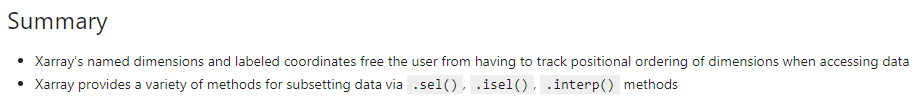

# Data Visualization

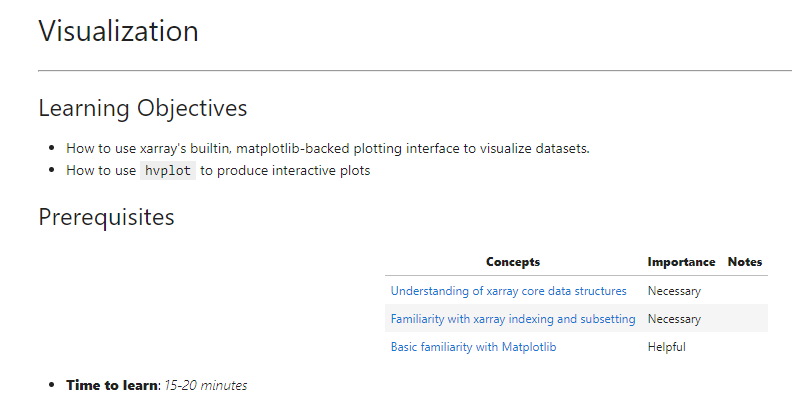

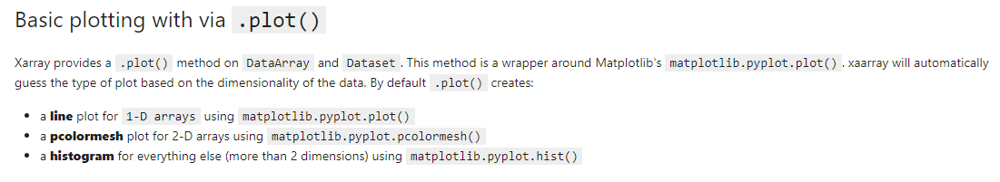

## 1D line plots

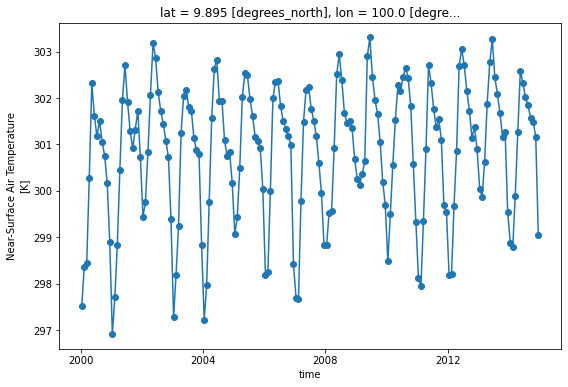

In [49]:
ds.tas.sel(lon = 100, lat = 10, method = 'nearest').plot(marker = 'o', size = 6)

In [67]:
# we want to compare plots of T at 3 different lats, we can use the hue kwarg to do this

import cftime
import matplotlib.pyplot as plt

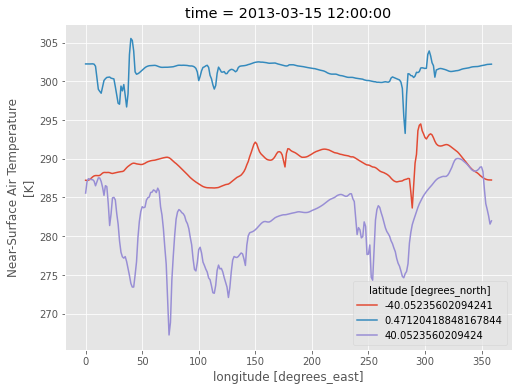

In [69]:
plt.style.use('ggplot')
ds.tas.sel(lat=[-40, 0, 40], time = cftime._cftime.DatetimeNoLeap(2013, 3, 2), method="nearest").plot(
    x="lon", hue="lat", figsize=(8, 6));

# 2D plots

In [70]:
# operator chaining means its possible to have multiple selection operators and add .plot() to the end to visualize the result

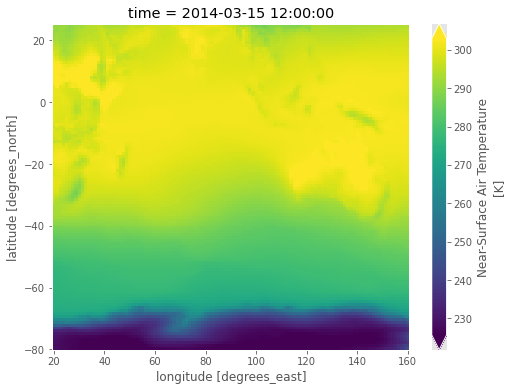

In [71]:
ds.tas.isel(time = -10).sel(lon = slice(20, 160), lat = slice(-80, 25)).plot(robust = True, figsize = (8,6))

The x- and y-axes are labeled with full names — "Latitude", "Longitude" — along with units. The colorbar has a nice label, again with units. And the title tells us the timestamp of the data presented.

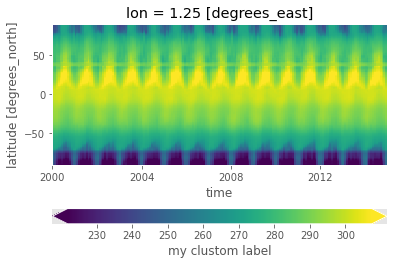

In [72]:
# define keyword arguments that are passed to matptolib.pyplot.colorbar
colorbar_kwargs = {
    "orientation": "horizontal",
    "label": "my clustom label",
    "pad": 0.2,
}

ds.tas.isel(lon=1).plot(
    x="time",  # coordinate to plot on the x-axis of the plot
    robust=True,  # set colorbar limits to 2nd and 98th percentile of data
    cbar_kwargs=colorbar_kwargs,
);

# Faceting

Faceting is an effective way of visualizing variations of 3D data where 2D slices are visualized in a panel (subplot) and the third dimensions is varied between panels (subplots).

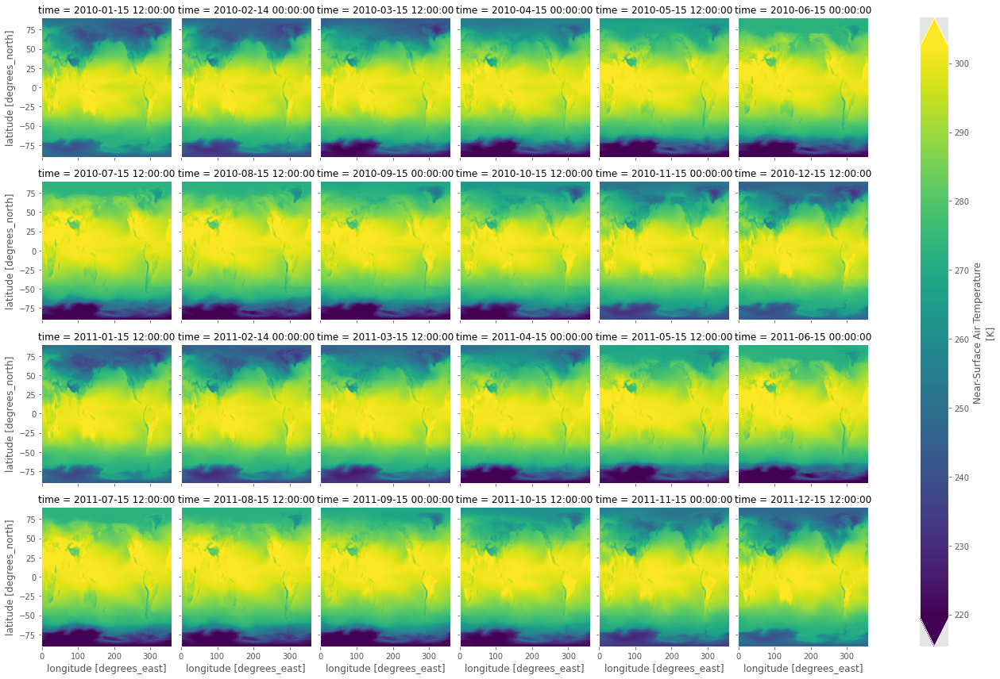

In [73]:
ds.tas.sel(time=slice("2010", "2011")).plot(col="time", col_wrap=6, robust=True);

# Histograms

(array([ 136673.,  240558.,  269893.,  627900.,  689006., 1115424.,
        1886530., 1994066., 2922350.,   70880.]),
 array([206.88835, 217.84947, 228.8106 , 239.77171, 250.73283, 261.69397,
        272.6551 , 283.6162 , 294.57733, 305.53845, 316.49957],
       dtype=float32),
 <BarContainer object of 10 artists>)

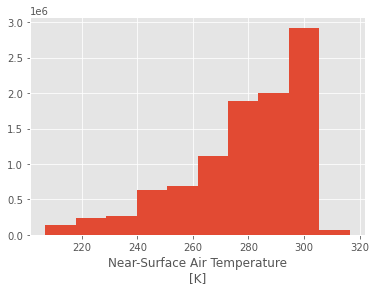

In [74]:
ds.tas.plot()

# Bonus Plot

Let's look at the air temperature data but at for all pressure levels. We are going to select out the first time index and the longitude corresponding to the Himalayas and plot a vertical profile of the atmosphere from pole to pole:

In [79]:
ds_air_all_pressure_levels = xr.open_dataset("data/ta_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc", engine="netcdf4")
data = ds_air_all_pressure_levels

C:\Users\henri\anaconda3\lib\site-packages\xarray\conventions.py:516: SerializationWarning: variable 'ta' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


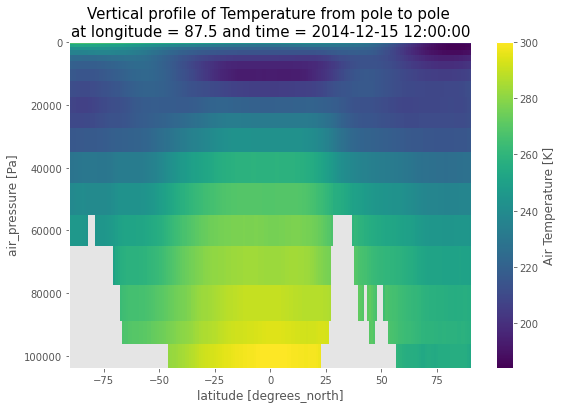

In [80]:
data = ds_air_all_pressure_levels.ta.isel(time=-1).sel(lon=86.93, method='nearest')
fig = data.plot(size=6, yincrease=False)
fig.axes.set_title(
    f'Vertical profile of Temperature from pole to pole \nat longitude = {data.lon.data} and time = {data.time.data}',
    size=15,
);

# Interactive Visualization using hvplot

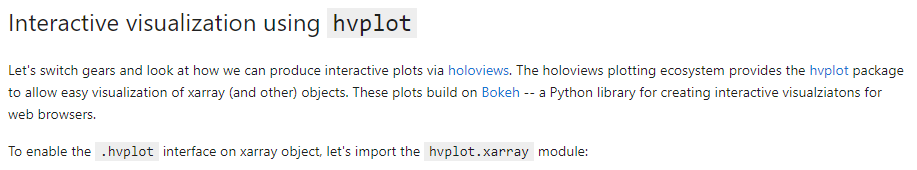

In [83]:
import hvplot.xarray

In [84]:
ds.tas.hvplot()

:NdOverlay   [Element]
   :Histogram   [tas]   (tas_count)

In [85]:
ds.tas.isel(time = 1).hvplot(cmap = 'fire')

:Image   [lon,lat]   (tas)

In [86]:
ds.tas.isel(time = -1, lon = 100).hvplot()

:Curve   [lat]   (tas)

In [87]:
ds.tas.sel(lat = 28.5, lon = 83.9, method = 'nearest').hvplot()

:Curve   [time]   (tas)

In [88]:
ds.tas.hvplot(groupby = 'time', clim = (ds.tas.min(), ds.tas.max()), cmap = 'turbo', widget_type = 'scrubber', widget_location = 'bottom')

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=179, width=550)
        [2] HSpacer()

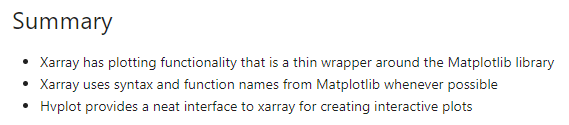

# Computation

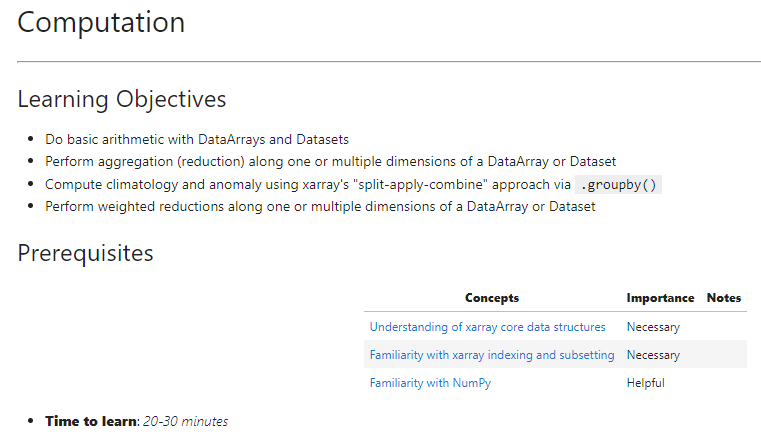

In [90]:
import numpy as np

## Arithmetic Operations

In [92]:
ds = xr.open_dataset(
    "./data/tos_Omon_CESM2_historical_r11i1p1f1_gr_200001-201412.nc", engine="netcdf4"
)
ds

C:\Users\henri\anaconda3\lib\site-packages\xarray\conventions.py:516: SerializationWarning: variable 'tos' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 180, lon: 360)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon        (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object ...
    lat_bnds   (lat, d2) float64 ...
    lon_bnds   (lon, d2) float64 ...
    tos        (time, lat, lon) float32 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

In [93]:
ds.tos + 273.15 # converting from degC to K

<xarray.DataArray 'tos' (time: 180, lat: 180, lon: 360)>
array([[[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        ...,
        [271.3552 , 271.3553 , 271.3554 , ..., 271.35495, 271.355  ,
         271.3551 ],
        [271.36005, 271.36014, 271.36023, ..., 271.35986, 271.35992,
         271.36   ],
        [271.36447, 271.36453, 271.3646 , ..., 271.3643 , 271.36435,
         271.3644 ]],

       [[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
...
        [271.40677, 271.40674, 271.4067 , ..., 271.40695, 271.4069 ,
         271.40683],
        [271.41296, 271.41293, 271.41293, ..., 271.41306, 271.413  ,
         271.41296],
        [271.41772, 271.41772, 271.41772, ..., 271.41766, 271.4177 ,
         271.4177 ]],

       [[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        ...,
        [271.39386, 271.39383, 271.3938 , ..., 271.39407, 271.394  ,
         271.39392],
        [271.39935, 271.39932, 271.39932, ..., 271.39948, 271.39944,
         271.39938],
        [271.40372, 271.40372, 271.40375, ..., 271.4037 , 271.4037 ,
         271.40372]]], dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5

## Aggregation Methods

A very common step during data analysis is to summarize the data in question by computing aggregations like sum(), mean(), median(), min(), max() in which reduced data provide insight into the nature of large dataset. Let's explore some of these aggregation methods:

In [94]:
# compute mean

ds.tos.mean()

<xarray.DataArray 'tos' ()>
array(14.250171, dtype=float32)

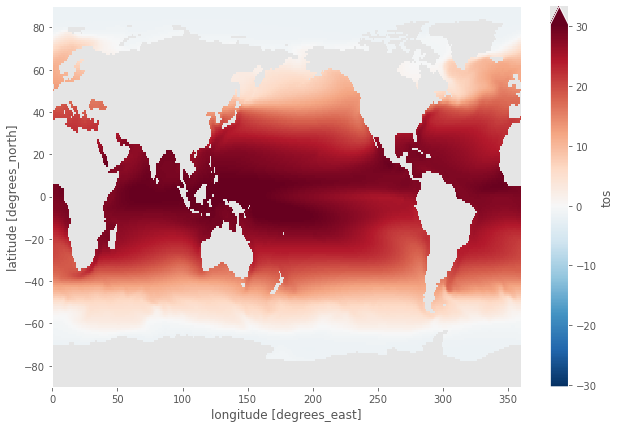

In [96]:
ds.tos.mean(dim = 'time').plot(size = 7, robust = True)

In [97]:
# compute temporal min

ds.tos.min(dim = ['time'])

<xarray.DataArray 'tos' (lat: 180, lon: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [-1.8083605, -1.8083031, -1.8082187, ..., -1.8083988, -1.8083944,
        -1.8083915],
       [-1.8025414, -1.8024837, -1.8024155, ..., -1.8026428, -1.8026177,
        -1.8025846],
       [-1.7984415, -1.7983989, -1.7983514, ..., -1.7985678, -1.7985296,
        -1.7984871]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5

In [98]:
# compute spatial sum
ds.tos.sum(dim = ['lat', 'lon'])

<xarray.DataArray 'tos' (time: 180)>
array([603767.  , 607702.5 , 603976.5 , 599373.56, 595119.94, 595716.75,
       598177.3 , 600670.6 , 597825.56, 591869.  , 590507.7 , 597189.2 ,
       605954.06, 609151.  , 606868.9 , 602329.9 , 599465.75, 601205.5 ,
       605144.4 , 608588.5 , 604046.9 , 598927.75, 597519.75, 603876.9 ,
       612424.44, 615765.2 , 612615.44, 606310.6 , 602034.4 , 600784.9 ,
       602013.5 , 603142.2 , 598850.9 , 591917.44, 589234.56, 596162.5 ,
       602942.06, 607196.9 , 604928.2 , 601735.6 , 599011.8 , 599490.9 ,
       600801.44, 602786.94, 598867.2 , 594081.8 , 593736.25, 598995.6 ,
       607285.25, 611901.06, 609562.75, 603527.3 , 600215.4 , 601372.6 ,
       604144.5 , 605376.75, 601256.2 , 595245.2 , 594002.06, 600490.4 ,
       611878.6 , 616563.  , 613050.8 , 605734.  , 600808.75, 600898.06,
       603930.56, 605644.7 , 599917.5 , 592048.06, 590082.8 , 596950.7 ,
       607701.94, 610844.7 , 609509.6 , 603380.94, 599838.1 , 600334.25,
       604386.6 , 607848.1 , 602155.2 , 594949.06, 593815.06, 598365.3 ,
       608730.8 , 612056.5 , 609922.5 , 603077.1 , 600134.1 , 602821.2 ,
       606152.75, 610257.8 , 604685.8 , 596858.  , 592894.8 , 599944.9 ,
       609764.44, 614610.75, 611434.75, 605606.4 , 603790.94, 605750.2 ,
       609250.06, 612935.7 , 609645.06, 601706.4 , 598896.5 , 605349.75,
       614671.8 , 618686.7 , 615895.2 , 609438.2 , 605399.56, 606126.75,
       607942.3 , 609680.4 , 604814.25, 595841.94, 591908.44, 595638.7 ,
       604798.94, 611327.1 , 609765.7 , 603727.56, 600970.  , 602514.  ,
       606303.7 , 609225.25, 603724.3 , 595944.8 , 594477.4 , 597807.4 ,
       607379.06, 611808.56, 610112.94, 607196.3 , 604733.06, 605488.25,
       610048.3 , 612655.75, 608906.25, 602349.7 , 601754.2 , 609220.4 ,
       619367.1 , 623783.2 , 619949.7 , 613369.06, 610190.8 , 611091.2 ,
       614213.44, 615665.06, 611722.2 , 606259.56, 605970.2 , 611463.3 ,
       619794.6 , 626036.5 , 623085.44, 616295.9 , 611886.3 , 611881.9 ,
       614420.75, 616853.56, 610375.44, 603471.5 , 602108.25, 608094.3 ,
       617450.7 , 623508.7 , 619830.2 , 612033.3 , 608737.2 , 610105.25,
       613692.7 , 616360.44, 611735.4 , 606512.7 , 604249.44, 608777.44],
      dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [99]:
ds.tos.mean(dim = ['lat', 'lon'])

<xarray.DataArray 'tos' (time: 180)>
array([14.209291 , 14.301911 , 14.214222 , 14.105894 , 14.005788 ,
       14.019834 , 14.077742 , 14.13642  , 14.069463 , 13.929279 ,
       13.897242 , 14.054486 , 14.260762 , 14.336    , 14.282292 ,
       14.175469 , 14.108064 , 14.149008 , 14.241707 , 14.3227625,
       14.2158785, 14.095403 , 14.062266 , 14.211877 , 14.413039 ,
       14.491661 , 14.417534 , 14.269154 , 14.168515 , 14.139109 ,
       14.168024 , 14.194587 , 14.093594 , 13.930419 , 13.867279 ,
       14.030324 , 14.189877 , 14.290011 , 14.236619 , 14.161484 ,
       14.097381 , 14.108655 , 14.139499 , 14.186226 , 14.093977 ,
       13.981357 , 13.973224 , 14.097    , 14.292091 , 14.400722 ,
       14.345691 , 14.20365  , 14.125706 , 14.152941 , 14.218176 ,
       14.247176 , 14.150201 , 14.008736 , 13.97948  , 14.132178 ,
       14.400193 , 14.510438 , 14.42778  , 14.255584 , 14.13967  ,
       14.141772 , 14.2131405, 14.253482 , 14.118695 , 13.933494 ,
       13.887242 , 14.048874 , 14.301898 , 14.37586  , 14.34444  ,
       14.200206 , 14.116828 , 14.128504 , 14.223874 , 14.305338 ,
       14.171358 , 14.001766 , 13.975079 , 14.082166 , 14.326112 ,
       14.40438  , 14.354157 , 14.193055 , 14.123794 , 14.187033 ,
       14.265439 , 14.362049 , 14.230915 , 14.046692 , 13.953421 ,
       14.11934  , 14.350437 , 14.464493 , 14.389748 , 14.25258  ,
       14.209855 , 14.255964 , 14.338332 , 14.425071 , 14.347628 ,
       14.160796 , 14.094667 , 14.24654  , 14.46593  , 14.560417 ,
       14.494721 , 14.342759 , 14.247713 , 14.264827 , 14.307555 ,
       14.348459 , 14.233938 , 14.022779 , 13.930207 , 14.017997 ,
       14.233578 , 14.387215 , 14.350467 , 14.208364 , 14.143466 ,
       14.179803 , 14.2689905, 14.337748 , 14.208286 , 14.025201 ,
       13.990665 , 14.069036 , 14.294299 , 14.398544 , 14.358639 ,
       14.289998 , 14.232027 , 14.2498   , 14.357119 , 14.418483 ,
       14.33024  , 14.175936 , 14.1619215, 14.337633 , 14.576431 ,
       14.68036  , 14.590141 , 14.43527  , 14.360472 , 14.381661 ,
       14.455142 , 14.4893055, 14.396512 , 14.267952 , 14.261142 ,
       14.390419 , 14.586492 , 14.733391 , 14.663939 , 14.504151 ,
       14.400374 , 14.40027  , 14.460021 , 14.517276 , 14.364817 ,
       14.202337 , 14.170254 , 14.311132 , 14.531329 , 14.6739   ,
       14.587329 , 14.403834 , 14.3262615, 14.3584585, 14.442886 ,
       14.505671 , 14.396822 , 14.27391  , 14.220645 , 14.327209 ],
      dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [101]:
# compute temporal median
ds.tos.median(dim = 'time')

<xarray.DataArray 'tos' (lat: 180, lon: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [-1.7648907, -1.7648032, -1.7647004, ..., -1.7650614, -1.7650102,
        -1.7649589],
       [-1.7590305, -1.7589546, -1.7588665, ..., -1.7591925, -1.7591486,
        -1.759095 ],
       [-1.7536805, -1.753602 , -1.7535168, ..., -1.753901 , -1.753833 ,
        -1.7537591]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5

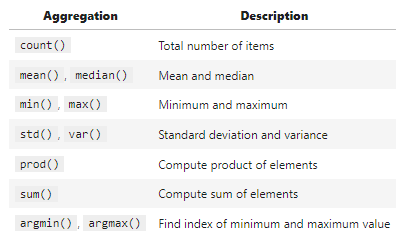

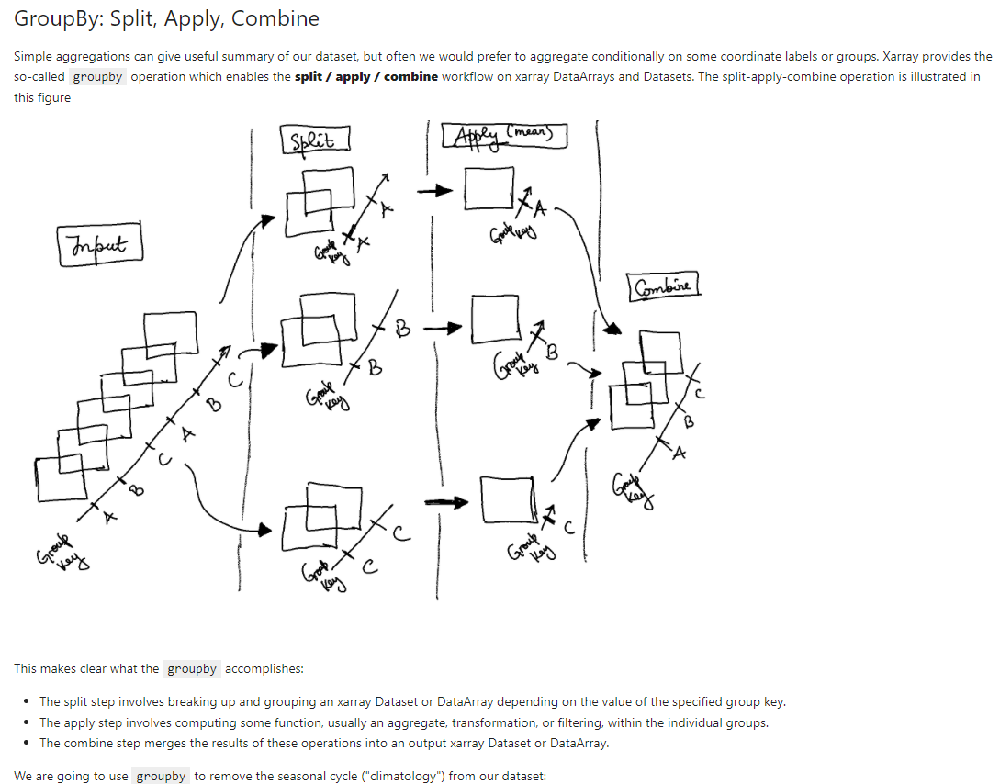

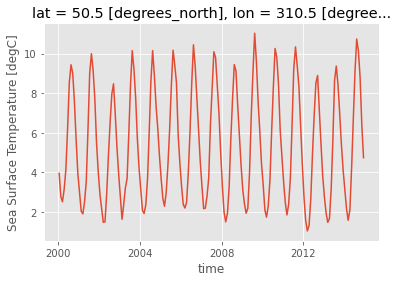

In [102]:
ds.tos.sel(lon = 310, lat = 50, method = 'nearest').plot()

## Split

In [103]:
# lets group data by month

ds.tos.groupby(ds.time.dt.month)

DataArrayGroupBy, grouped over 'month'
12 groups with labels 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12.

In [104]:
ds.time.dt.year

<xarray.DataArray 'year' (time: 180)>
array([2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001,
       2001, 2001, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002,
       2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2003, 2003, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2009, 2009,
       2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2010,
       2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010,
       2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011,
       2011, 2012, 2012, 2012, 2012, 2012, 2012, 2012, 2012, 2012, 2012,
       2012, 2012, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013,
       2013, 2013, 2013, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014,
       2014, 2014, 2014, 2014])
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [105]:
ds.time.dt.month

<xarray.DataArray 'month' (time: 180)>
array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,
        6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10,
       11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,
        4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,
        9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,
        2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,
        7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11,
       12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,
        5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9,
       10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,
        3,  4,  5,  6,  7,  8,  9, 10, 11, 12])
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [106]:
# can also do this:

# ds.tos.groupby('time.month')

## Apply and Combine

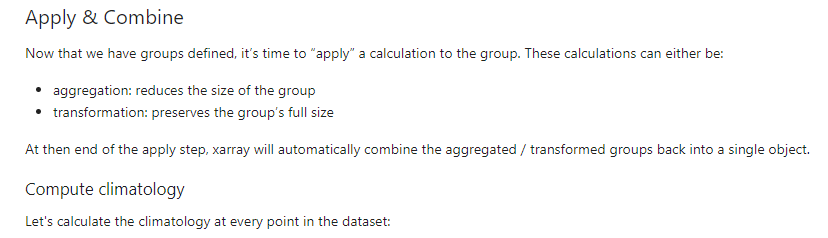

In [107]:
tos_clim = ds.tos.groupby('time.month').mean()
tos_clim

<xarray.DataArray 'tos' (month: 12, lat: 180, lon: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.780786 , -1.780688 , -1.7805718, ..., -1.7809757,
         -1.7809197, -1.7808627],
        [-1.7745041, -1.7744204, -1.7743237, ..., -1.77467  ,
         -1.774626 , -1.7745715],
        [-1.7691481, -1.7690798, -1.7690051, ..., -1.7693441,
         -1.7692844, -1.7692182]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.7605033, -1.760397 , -1.7602725, ..., -1.760718 ,
         -1.7606541, -1.7605885],
        [-1.7544289, -1.7543424, -1.7542422, ..., -1.754608 ,
         -1.754559 , -1.7545002],
        [-1.7492163, -1.749148 , -1.7490736, ..., -1.7494118,
         -1.7493519, -1.7492864]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7711828, -1.7710832, -1.7709653, ..., -1.7713748,
         -1.7713183, -1.7712607],
        [-1.7648666, -1.7647841, -1.7646879, ..., -1.7650299,
         -1.7649865, -1.7649331],
        [-1.759478 , -1.7594113, -1.7593384, ..., -1.7596704,
         -1.7596117, -1.759547 ]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

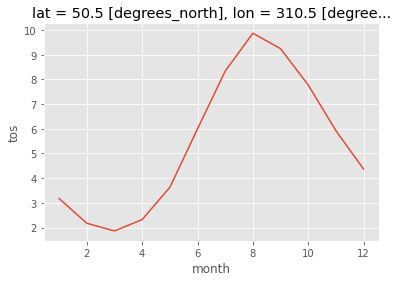

In [108]:
# plot climatology at a specific point

tos_clim.sel(lon = 310, lat = 50, method = 'nearest').plot()

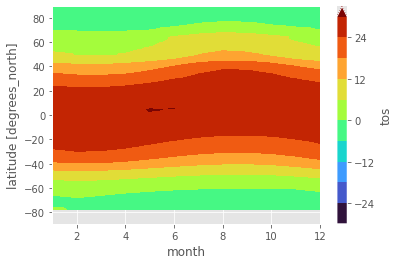

In [109]:
# plot zonal mean climatology

tos_clim.mean(dim = 'lon').transpose().plot.contourf(levels = 12, robust = True, cmap = 'turbo')

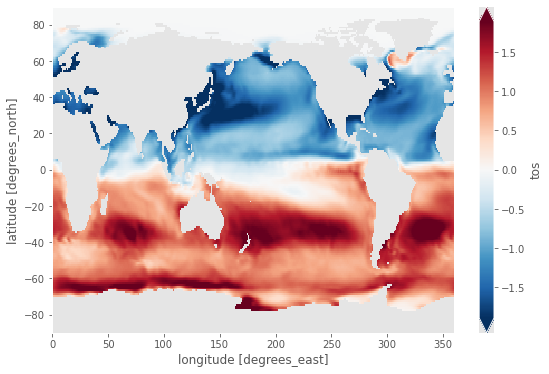

In [110]:
# difference between jan and dec climatologies

(tos_clim.sel(month = 1) - tos_clim.sel(month = 12)).plot(size = 6, robust = True)

In [111]:
# compute anomaly

gb = ds.tos.groupby('time.month')
tos_anom = gb - gb.mean(dim = 'time')
tos_anom

<xarray.DataArray 'tos' (time: 180, lat: 180, lon: 360)>
array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [-0.01402271, -0.01401687, -0.01401365, ..., -0.01406252,
         -0.01404917, -0.01403356],
        [-0.01544118, -0.01544476, -0.01545036, ..., -0.0154475 ,
         -0.01544321, -0.01544082],
        [-0.01638114, -0.01639009, -0.01639998, ..., -0.01635301,
         -0.01636147, -0.01637137]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
...
        [ 0.01727939,  0.01713431,  0.01698041, ...,  0.0176847 ,
          0.01755834,  0.01742125],
        [ 0.0173862 ,  0.0172919 ,  0.01719594, ...,  0.01766813,
          0.01757395,  0.01748013],
        [ 0.01693714,  0.01687253,  0.01680517, ...,  0.01709175,
          0.0170424 ,  0.01699162]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [ 0.01506364,  0.01491845,  0.01476014, ...,  0.01545238,
          0.0153321 ,  0.01520228],
        [ 0.0142287 ,  0.01412642,  0.01402068, ...,  0.0145216 ,
          0.01442552,  0.01432824],
        [ 0.01320827,  0.01314461,  0.01307774, ...,  0.0133611 ,
          0.0133127 ,  0.01326215]]], dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12

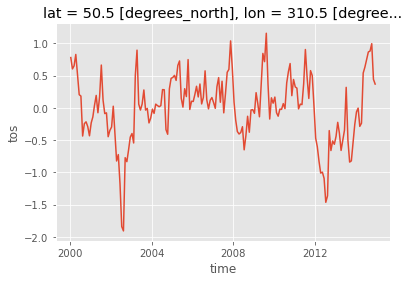

In [112]:
tos_anom.sel(lon = 310, lat = 50, method = 'nearest').plot()

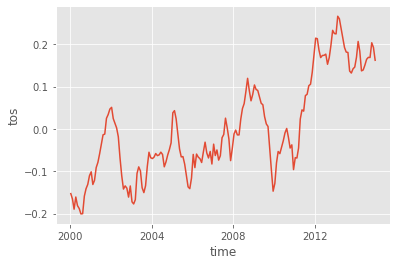

In [114]:
unweighted_mean_global_anom = tos_anom.mean(dim=['lat', 'lon'])
unweighted_mean_global_anom.plot()

In [115]:
areacello = xr.open_dataset("data/areacello_Ofx_CESM2_historical_r11i1p1f1_gr.nc").areacello
areacello

<xarray.DataArray 'areacello' (lat: 180, lon: 360)>
array([[1.078982e+08, 1.078982e+08, 1.078982e+08, ..., 1.078982e+08,
        1.078982e+08, 1.078982e+08],
       [3.236618e+08, 3.236618e+08, 3.236618e+08, ..., 3.236618e+08,
        3.236618e+08, 3.236618e+08],
       [5.393268e+08, 5.393268e+08, 5.393268e+08, ..., 5.393268e+08,
        5.393268e+08, 5.393268e+08],
       ...,
       [5.393268e+08, 5.393268e+08, 5.393268e+08, ..., 5.393268e+08,
        5.393268e+08, 5.393268e+08],
       [3.236618e+08, 3.236618e+08, 3.236618e+08, ..., 3.236618e+08,
        3.236618e+08, 3.236618e+08],
       [1.078982e+08, 1.078982e+08, 1.078982e+08, ..., 1.078982e+08,
        1.078982e+08, 1.078982e+08]])
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes:
    cell_methods:   area: sum
    comment:        TAREA
    description:    Cell areas for any grid used to report ocean variables an...
    frequency:      fx
    id:             areacello
    long_name:      Grid-Cell Area for Ocean Variables
    mipTable:       Ofx
    out_name:       areacello
    prov:           Ofx ((isd.003))
    realm:          ocean
    standard_name:  cell_area
    time_label:     None
    time_title:     No temporal dimensions ... fixed field
    title:          Grid-Cell Area for Ocean Variables
    type:           real
    units:          m2
    variable_id:    areacello

In [116]:
# mean global anomaly

weighted_mean_global_anom = tos_anom.weighted(areacello).mean(dim = ['lat', 'lon'])

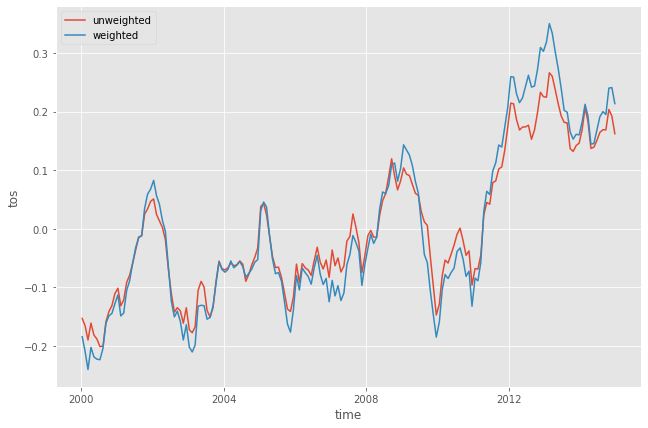

In [117]:
# plotting both unweighted and weighted means:

unweighted_mean_global_anom.plot(size = 7)
weighted_mean_global_anom.plot()
plt.legend(['unweighted', 'weighted'])

## Other high level computation functionality

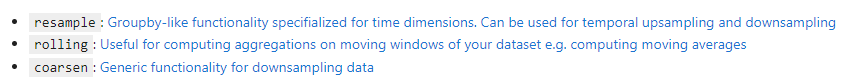

In [118]:
# resample to annual frequency
r = ds.tos.resample(time = 'AS')
r

DataArrayResample, grouped over '__resample_dim__'
15 groups with labels 2000-01-01, 00:00:00, ..., 201....

In [119]:
r.mean()

<xarray.DataArray 'tos' (time: 15, lat: 180, lon: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7474419, -1.7474264, -1.7474008, ..., -1.7474308,
         -1.7474365, -1.7474445],
        [-1.7424874, -1.7424612, -1.7424251, ..., -1.742536 ,
         -1.7425283, -1.7425116],
        [-1.7382039, -1.7381679, -1.7381277, ..., -1.7383199,
         -1.7382846, -1.7382454]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.6902231, -1.6899008, -1.6895409, ..., -1.6910189,
         -1.6907759, -1.6905178],
        [-1.6879102, -1.6876906, -1.6874666, ..., -1.6885366,
         -1.6883289, -1.688121 ],
        [-1.6883243, -1.6881752, -1.6880217, ..., -1.6886654,
         -1.6885542, -1.6884427]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.6893266, -1.6893964, -1.6894479, ..., -1.6889572,
         -1.6890831, -1.6892204],
        [-1.6776317, -1.6777302, -1.6778082, ..., -1.6771463,
         -1.6773272, -1.677492 ],
        [-1.672563 , -1.6726688, -1.6727766, ..., -1.6723493,
         -1.6724195, -1.6724887]]], dtype=float32)
Coordinates:
  * time     (time) object 2000-01-01 00:00:00 ... 2014-01-01 00:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5

In [120]:
# compute a 5-month moving average
m_avg = ds.tos.rolling(time = 5, center = True).mean()
m_avg

<xarray.DataArray 'tos' (time: 180, lat: 180, lon: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]]], dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes:
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    comment:        Model data on the 1x1 grid includes values in all cells f...
    description:    This may differ from "surface temperature" in regions of ...
    frequency:      mon
    id:             tos
    long_name:      Sea Surface Temperature
    mipTable:       Omon
    out_name:       tos
    prov:           Omon ((isd.003))
    realm:          ocean
    standard_name:  sea_surface_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Sea Surface Temperature
    type:           real
    units:          degC
    variable_id:    tos

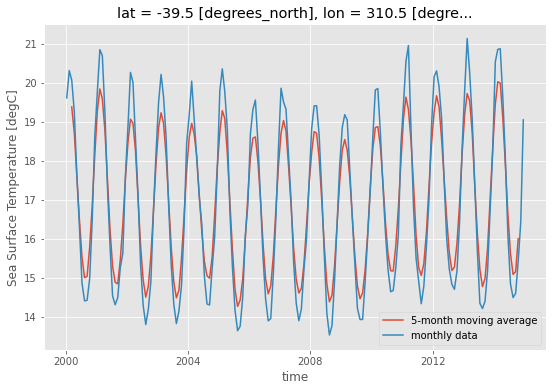

In [121]:
m_avg.isel(lat = 50, lon = 310).plot(size = 6)
ds.tos.isel(lat = 50, lon = 310).plot()
plt.legend(['5-month moving average', 'monthly data'])

# Masking Data

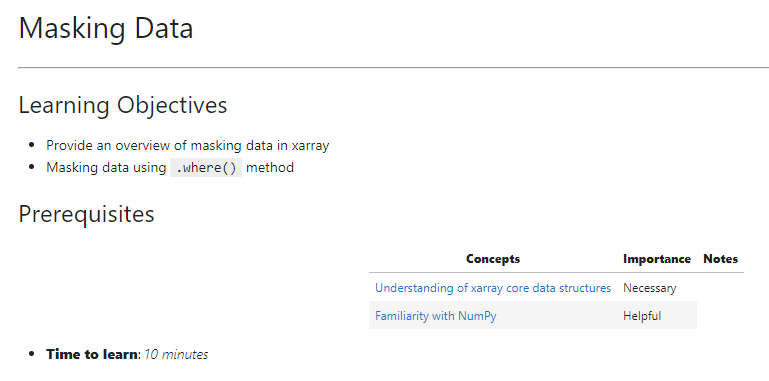

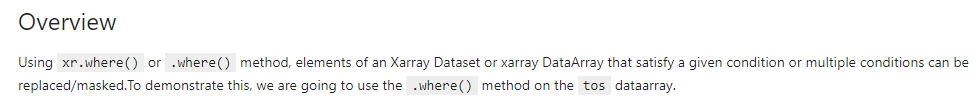

In [122]:
ds = xr.open_dataset(
    "./data/tos_Omon_CESM2_historical_r11i1p1f1_gr_200001-201412.nc", engine="netcdf4"
)
ds

C:\Users\henri\anaconda3\lib\site-packages\xarray\conventions.py:516: SerializationWarning: variable 'tos' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 180, lon: 360)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon        (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object ...
    lat_bnds   (lat, d2) float64 ...
    lon_bnds   (lon, d2) float64 ...
    tos        (time, lat, lon) float32 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

In [123]:
# using where with one condition

sample = ds.tos.isel(time = -1)
sample

<xarray.DataArray 'tos' (lat: 180, lon: 360)>
array([[      nan,       nan,       nan, ...,       nan,       nan,       nan],
       [      nan,       nan,       nan, ...,       nan,       nan,       nan],
       [      nan,       nan,       nan, ...,       nan,       nan,       nan],
       ...,
       [-1.756119, -1.756165, -1.756205, ..., -1.755922, -1.755986, -1.756058],
       [-1.750638, -1.750658, -1.750667, ..., -1.750508, -1.750561, -1.750605],
       [-1.74627 , -1.746267, -1.746261, ..., -1.746309, -1.746299, -1.746285]],
      dtype=float32)
Coordinates:
    time     object 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes:
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    comment:        Model data on the 1x1 grid includes values in all cells f...
    description:    This may differ from "surface temperature" in regions of ...
    frequency:      mon
    id:             tos
    long_name:      Sea Surface Temperature
    mipTable:       Omon
    out_name:       tos
    prov:           Omon ((isd.003))
    realm:          ocean
    standard_name:  sea_surface_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Sea Surface Temperature
    type:           real
    units:          degC
    variable_id:    tos

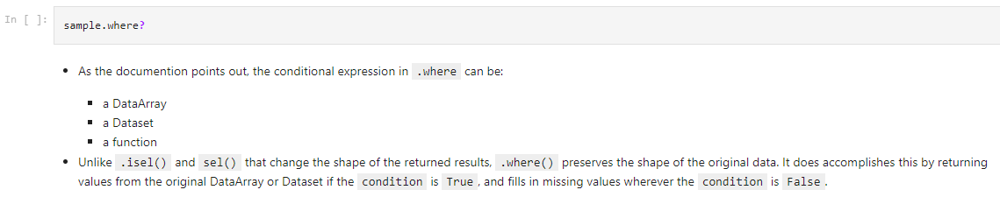

In [124]:
# for demonstration purposes, lets use where to mask locations with temperature values greater than 0:

masked_sample = sample.where(sample < 0.0)
masked_sample

<xarray.DataArray 'tos' (lat: 180, lon: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [-1.7561191, -1.7561648, -1.7562052, ..., -1.7559224, -1.7559862,
        -1.7560585],
       [-1.7506379, -1.7506577, -1.7506672, ..., -1.7505083, -1.750561 ,
        -1.7506049],
       [-1.7462697, -1.7462667, -1.7462606, ..., -1.7463093, -1.746299 ,
        -1.7462848]], dtype=float32)
Coordinates:
    time     object 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes:
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    comment:        Model data on the 1x1 grid includes values in all cells f...
    description:    This may differ from "surface temperature" in regions of ...
    frequency:      mon
    id:             tos
    long_name:      Sea Surface Temperature
    mipTable:       Omon
    out_name:       tos
    prov:           Omon ((isd.003))
    realm:          ocean
    standard_name:  sea_surface_temperature
    time:           time
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Sea Surface Temperature
    type:           real
    units:          degC
    variable_id:    tos

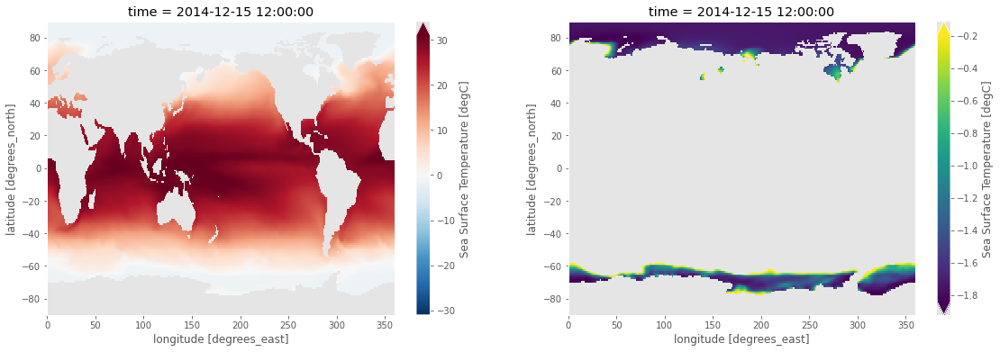

In [125]:
# plot both the original sample and the masked sample

fig, axes = plt.subplots(ncols = 2, figsize = (19,6))
sample.plot(ax = axes[0], robust = True)
masked_sample.plot(ax = axes[1], robust = True)

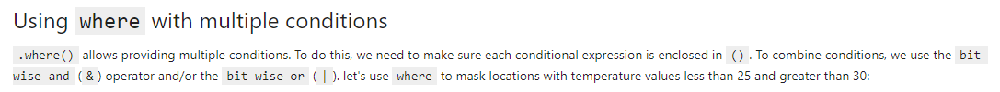

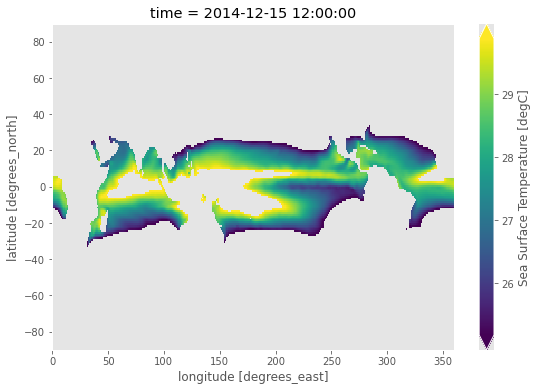

In [126]:
sample.where((sample >25) & (sample < 30)).plot(size = 6, robust = True)

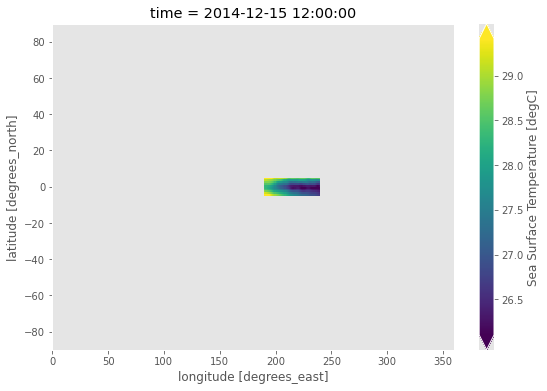

In [127]:
sample.where((sample.lat < 5) & (sample.lat > -5) & (sample.lon > 190) & (sample.lon < 240)).plot(
    size=6, robust=True
);

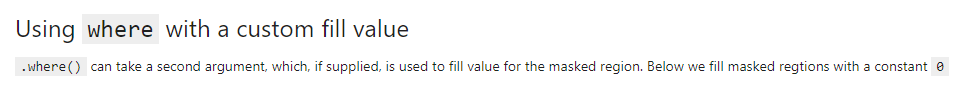

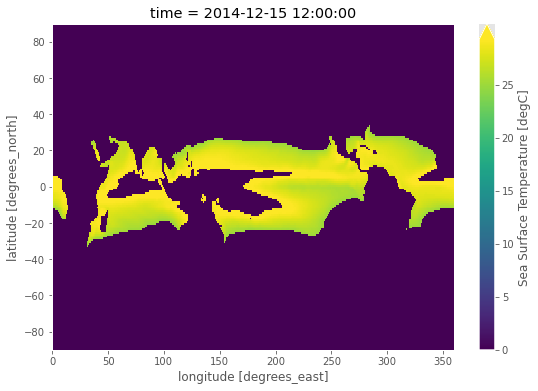

In [128]:
sample.where((sample > 25) & (sample < 30), 0).plot(size=6, robust=True);

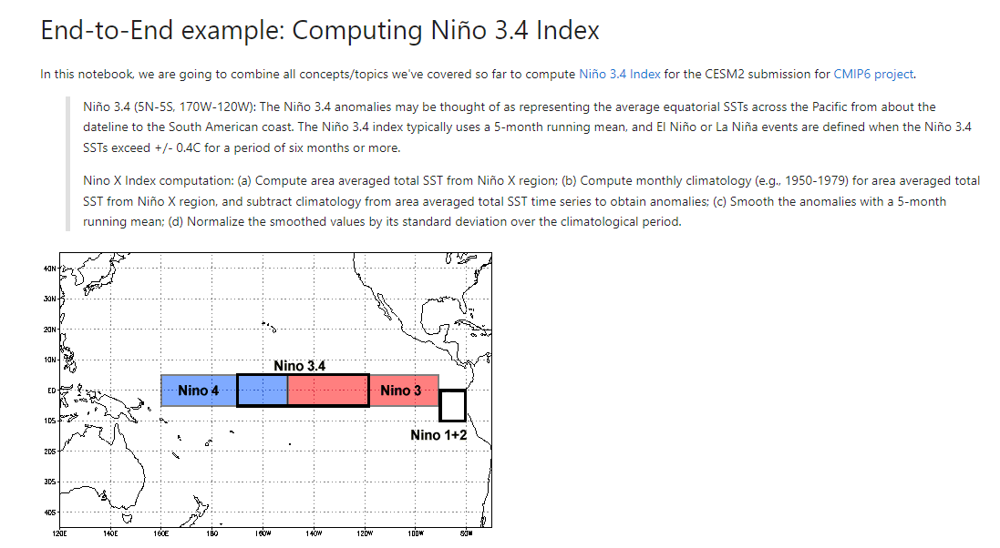

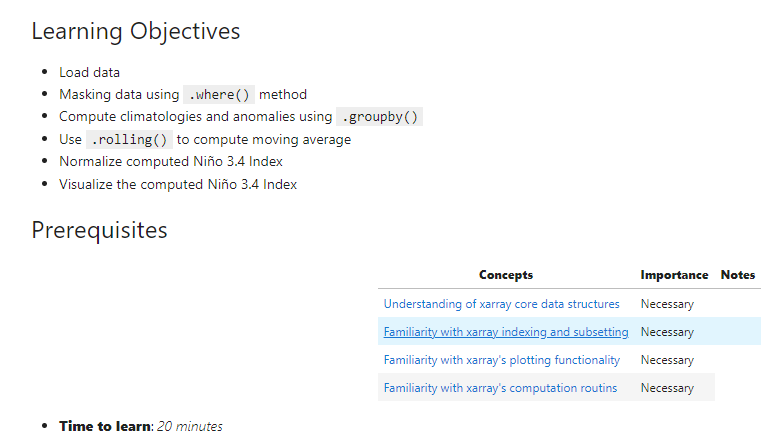

In [131]:
import cartopy.crs as ccrs

In [132]:
# open the SST dataset and areacello

data = xr.open_dataset(
    "./data/tos_Omon_CESM2_historical_r11i1p1f1_gr_200001-201412.nc", engine="netcdf4"
)
areacello = xr.open_dataset(
    "./data/areacello_Ofx_CESM2_historical_r11i1p1f1_gr.nc", engine="netcdf4"
)

# Merge the two datasets in a single dataset
ds = xr.merge([data, areacello])
ds

C:\Users\henri\anaconda3\lib\site-packages\xarray\conventions.py:516: SerializationWarning: variable 'tos' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 180, lon: 360, lev: 33)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon        (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
  * lev        (lev) float64 0.0 10.0 20.0 30.0 ... 4e+03 4.5e+03 5e+03 5.5e+03
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object ...
    lat_bnds   (lat, d2) float64 -90.0 -89.0 -89.0 -88.0 ... 88.0 89.0 89.0 90.0
    lon_bnds   (lon, d2) float64 0.0 1.0 1.0 2.0 2.0 ... 358.0 359.0 359.0 360.0
    tos        (time, lat, lon) float32 ...
    lev_bnds   (lev, d2) float64 ...
    areacello  (lat, lon) float64 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

C:\Users\henri\anaconda3\lib\site-packages\cartopy\io\__init__.py:260: DownloadWarning: Downloading: https://naciscdn.org/naturalearth/110m/physical/ne_110m_coastline.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


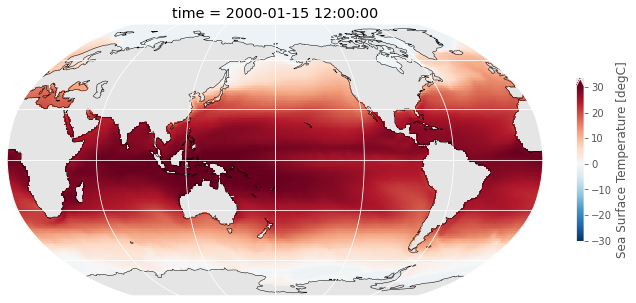

In [133]:
# visualize the first time slice to make sure the data looks okay

fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.coastlines()
ax.gridlines()
ds.tos.isel(time=0).plot(
    robust=True, ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={'shrink': 0.5}
)
ax.set_global()

In [134]:
# select the nino 3.4 region

tos_nino34 = ds.sel(lat = slice(-5, 5), lon = slice(190, 240))
tos_nino34

<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 10, lon: 50, lev: 33)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -4.5 -3.5 -2.5 -1.5 -0.5 0.5 1.5 2.5 3.5 4.5
  * lon        (lon) float64 190.5 191.5 192.5 193.5 ... 236.5 237.5 238.5 239.5
  * lev        (lev) float64 0.0 10.0 20.0 30.0 ... 4e+03 4.5e+03 5e+03 5.5e+03
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object 2000-01-01 00:00:00 ... 2015-01-01 00:00:00
    lat_bnds   (lat, d2) float64 -5.0 -4.0 -4.0 -3.0 -3.0 ... 3.0 4.0 4.0 5.0
    lon_bnds   (lon, d2) float64 190.0 191.0 191.0 192.0 ... 239.0 239.0 240.0
    tos        (time, lat, lon) float32 ...
    lev_bnds   (lev, d2) float64 0.0 5.0 5.0 15.0 ... 5.25e+03 5.25e+03 5.5e+03
    areacello  (lat, lon) float64 1.233e+10 1.233e+10 ... 1.233e+10 1.233e+10
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

In [ ]:
#Another option for selecting our region of interest is to use:

# tos_nino34 = ds.where((ds.lat<5) & (ds.lat>-5) & (ds.lon>190) & (ds.lon<240), drop=True)

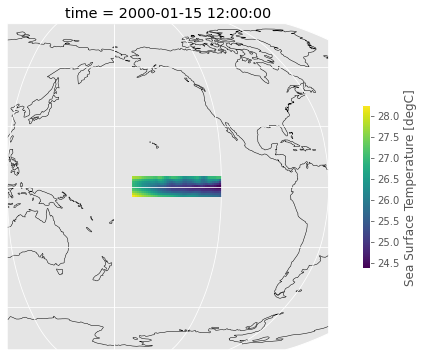

In [135]:
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.coastlines()
ax.gridlines()
tos_nino34.tos.isel(time=0).plot(ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={'shrink': 0.5})
ax.set_extent((120, 300, 10, -10))

In [136]:
# Compute monthly climatology for area averaged total SST from Niño 3.4 region, and subtract climatology from area averaged total SST time series to obtain anomalies;

gb = tos_nino34.tos.groupby('time.month')
tos_nino34_anom = gb - gb.mean(dim='time')
index_nino34 = tos_nino34_anom.weighted(tos_nino34.areacello).mean(dim=['lat', 'lon'])

In [139]:
# Smooth the anomalies with a 5-month running mean

index_nino34_rolling_mean = index_nino34.rolling(time=5).mean()

In [140]:
# Normalize the smoothed values by its standard deviation over the climatological period

std_dev = tos_nino34.tos.std()
std_dev

normalized_index_nino34_rolling_mean = index_nino34_rolling_mean / std_dev

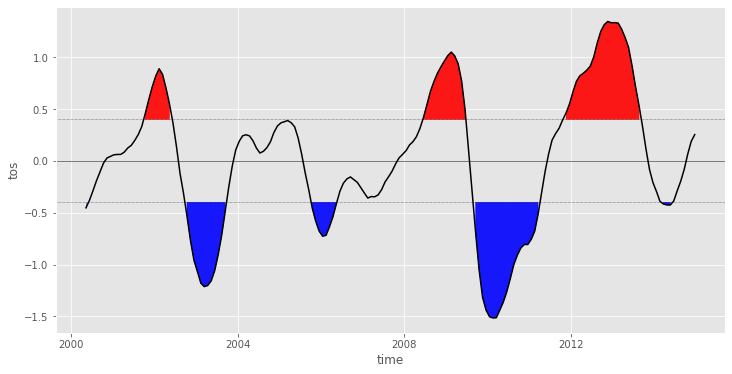

In [141]:
# visualize the computer nino 3.4

fig = plt.figure(figsize=(12, 6))

# Add -0.4/+0.4 lines which are the El Niño 3.4 thresholds
plt.fill_between(
    normalized_index_nino34_rolling_mean.time.data,
    normalized_index_nino34_rolling_mean.where(normalized_index_nino34_rolling_mean >= 0.4).data,
    0.4,
    color='red',
    alpha=0.9,
)
plt.fill_between(
    normalized_index_nino34_rolling_mean.time.data,
    normalized_index_nino34_rolling_mean.where(normalized_index_nino34_rolling_mean <= -0.4).data,
    -0.4,
    color='blue',
    alpha=0.9,
)

normalized_index_nino34_rolling_mean.plot(color='black')
plt.axhline(0, color='black', lw=0.5)
plt.axhline(0.4, color='black', linewidth=0.5, linestyle='dotted')
plt.axhline(-0.4, color='black', linewidth=0.5, linestyle='dotted');